<a href="https://colab.research.google.com/github/Bang-seok/2022_ETRI/blob/main/mainV1_KT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install pmdarima # Arima를 다루는 tool

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras import layers
from matplotlib import pyplot as plt
import matplotlib
from datetime import datetime, timedelta
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

import statsmodels.api as sm # 통계 라이브러리.

import seaborn as SNS # 시각화
#%matplotlib inline
import itertools
import datetime
from sklearn.metrics import mean_absolute_error

In [ ]:
import os
from google.colab import drive
drive.mount('/content/drive')
os.chdir('/content/drive/My Drive/Colab Notebooks/prediction')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')
# 한글폰트 사용을 위해 설치
# 아래 모듈을 설치하고 불러오면 별도의 한글폰트 설정이 필요 없습니다.
!pip install koreanize-matplotlib

import koreanize_matplotlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
kt_shoppingmall_raw_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/data/KT/KT데이터정리_코엑스.csv') #총 38개 기지국

#필요없는 "일자", "시간" series 삭제
kt_shoppingmall_df = kt_shoppingmall_raw_df.drop(["일자","시간"], axis=1)

#총 38개의 기지국으로 이루어져있다.
#2022.09.17(토) 00시~ 2022.10.16(일) 23시 까지의 모바일 트래픽
#09.30의 20시, 22시, 23시, 10.01의 01시, 04시가 결측치라 0으로 채워넣음.

kt_shoppingmall_df.columns = range(len(kt_shoppingmall_df.columns))

#결측치가 연속적으로 많은 기지국 데이터 삭제
for i in range(len(kt_shoppingmall_df.columns)):
    count = 0
    for j in range(1, len(kt_shoppingmall_df)):
        if (kt_shoppingmall_df[i][j-1] == kt_shoppingmall_df[i][j]):
            count = count + 1
    if (count > (len(kt_shoppingmall_df) / 10)):
        kt_shoppingmall_df = kt_shoppingmall_df.drop([i], axis=1)

#column 다시 재설정
kt_shoppingmall_df.columns = range(len(kt_shoppingmall_df.columns))

In [ ]:
#%cd /content/drive/My Drive/Colab Notebooks/prediction
kt_shoppingmall_df.index = pd.date_range(start="2022-09-17 00:00", end="2022-10-16 23:00",freq="1H")
kt_shoppingmall_df.head()

,0,1,2,3,4,5,6,7,8,9,...,26,27,28,29,30,31,32,33,34,35
2022-09-17 00:00:00,12438,898,84888,42070,766,1581,8677,786589,3306,9582,...,3094,31190,6274,102575,211313,16623,131,13920,2331,298
2022-09-17 01:00:00,12392,78,59797,30570,1552,2376,26876,462183,11858,2880,...,3921,29580,4137,28492,185485,23185,23,17659,12380,3
2022-09-17 02:00:00,12254,591,30639,30163,559,847,9553,465034,6014,1864,...,96,12275,13334,15287,191828,5090,8,6917,1979,9
2022-09-17 03:00:00,12271,389,28420,31804,434,743,8520,530372,3997,2872,...,654,5997,2900,124235,189262,2395,94,13124,13146,6
2022-09-17 04:00:00,12345,141,33208,38137,311,654,8537,243742,4089,1362,...,206,10123,7885,24525,187209,1032,3,15546,512,14


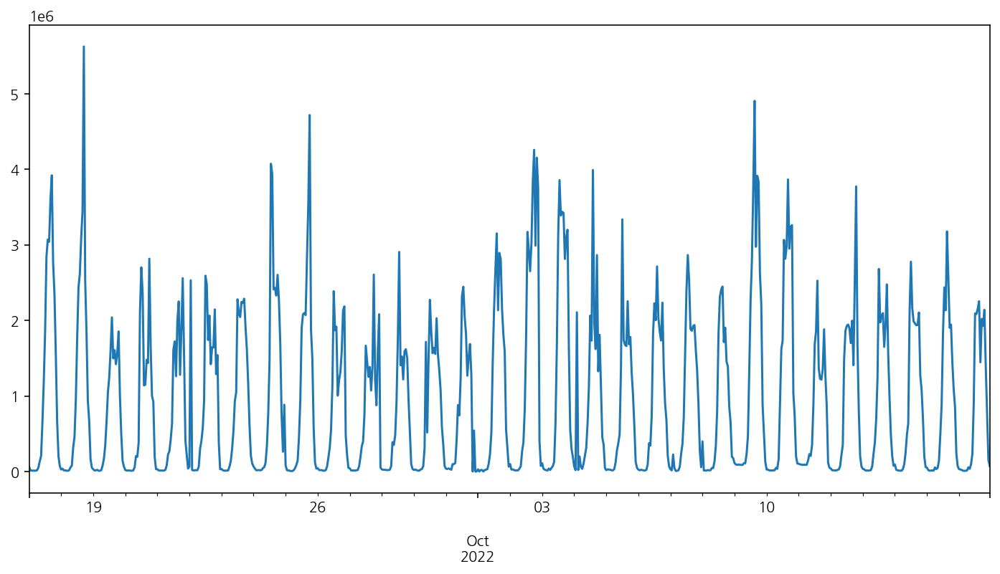

In [ ]:
plt.rcParams['figure.figsize'] = (12, 6)
kt_shoppingmall_df[19].plot() #2, 3, 9, 12, 13, 14, 15~19

In [ ]:
#결과를 저장할 list
Original_time = list()
Original_result = list()
Seasonal_time = list()
Seasonal_result = list()
Detrend_time = list()
Detrend_result = list()

In [ ]:
dfs = dict()
for i in range(len(kt_shoppingmall_df.columns)):
    dfs[i] = kt_shoppingmall_df[i]

In [ ]:
#dfs 데이터를 DataFrame으로 변경.
for i in range(len(dfs)):
    dfs[i] = pd.DataFrame(dfs[i])
    dfs[i] = dfs[i].rename(columns={i: 'Original'})
print(type(dfs))
print(type(dfs[0]))

<class 'dict'>
<class 'pandas.core.frame.DataFrame'>


/usr/local/lib/python3.8/dist-packages/statsmodels/tsa/seasonal.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(len(series), 1)


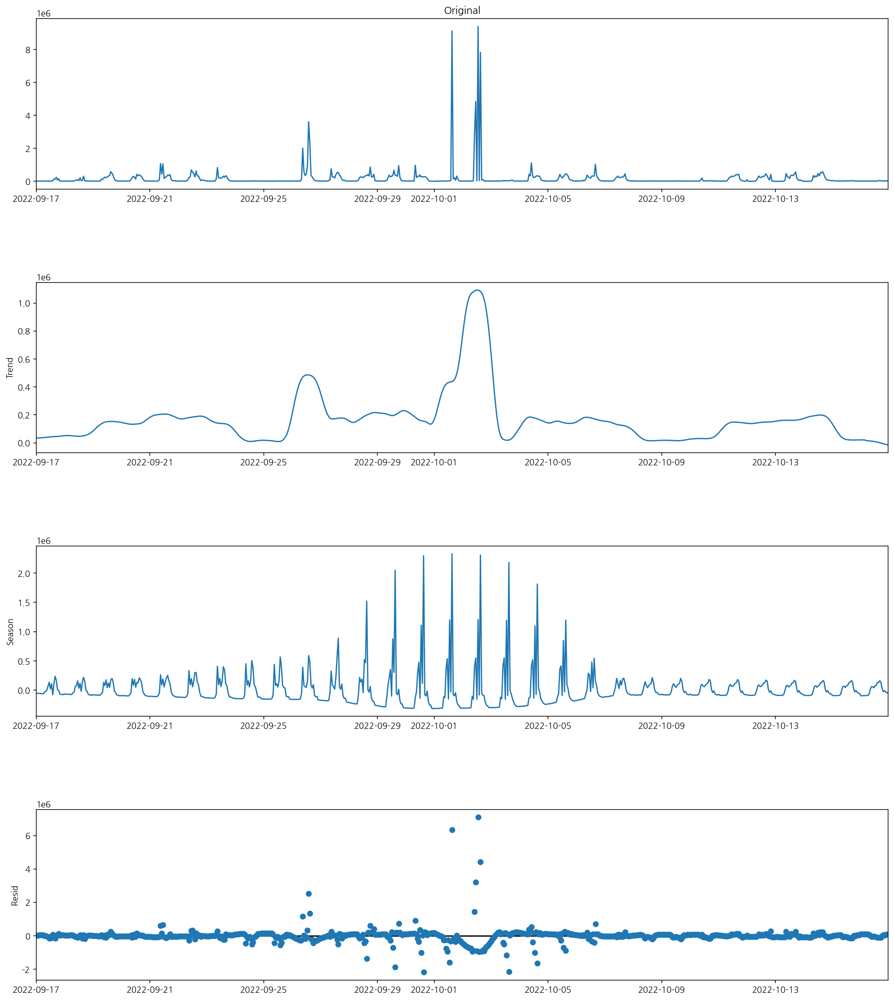

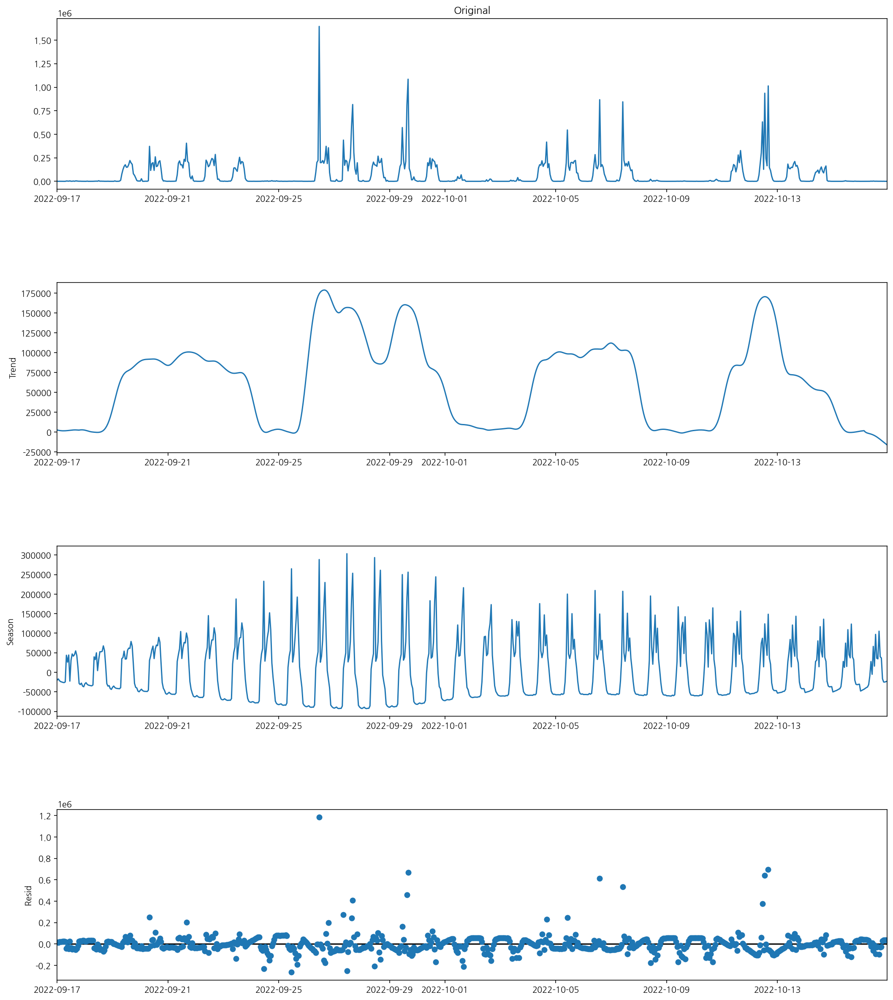

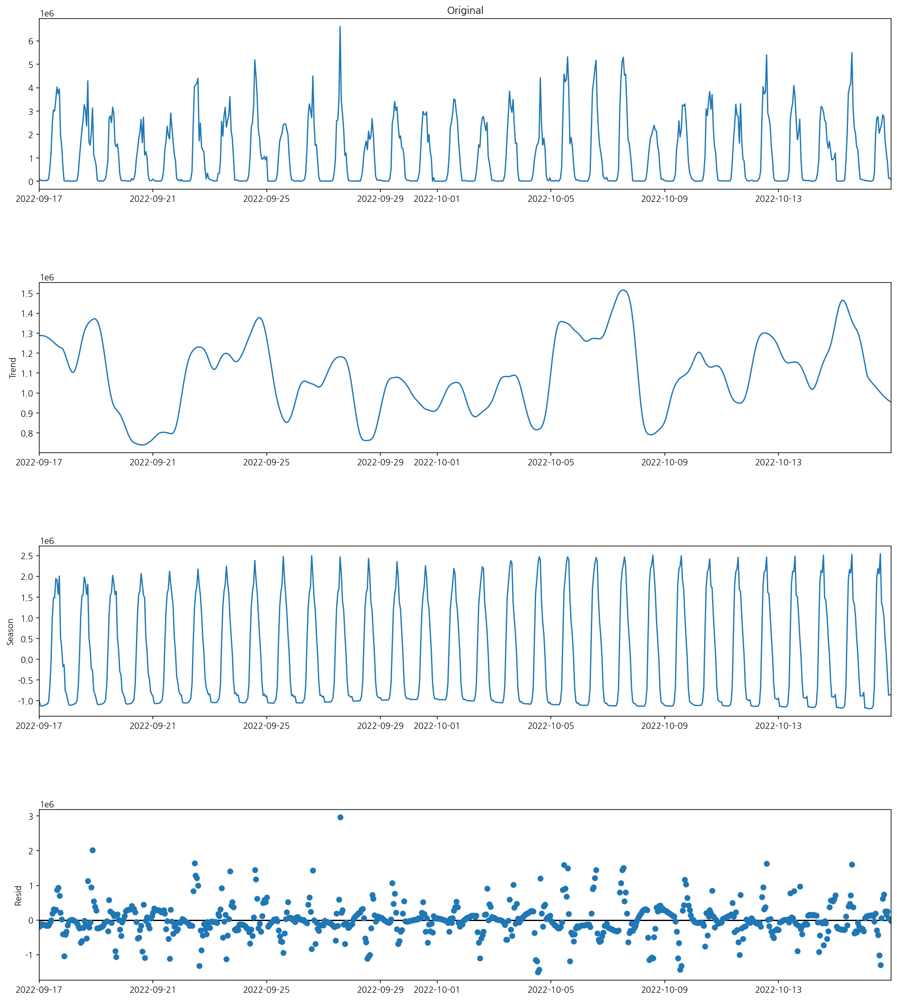

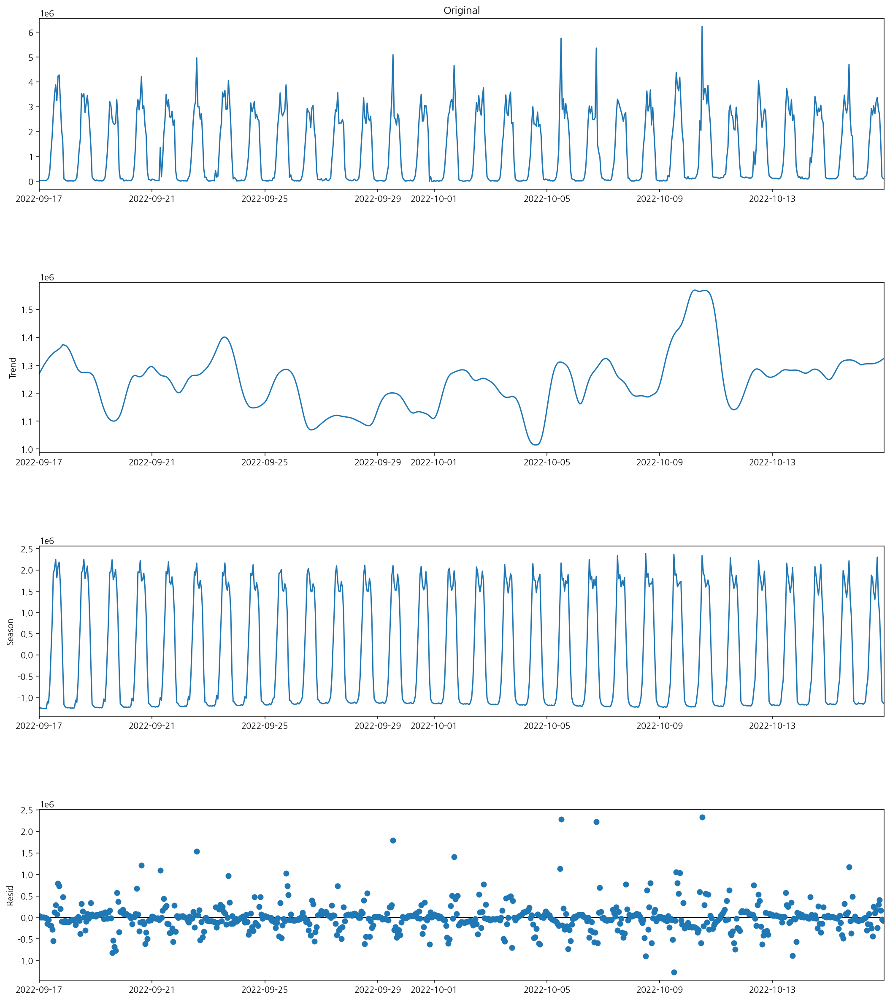

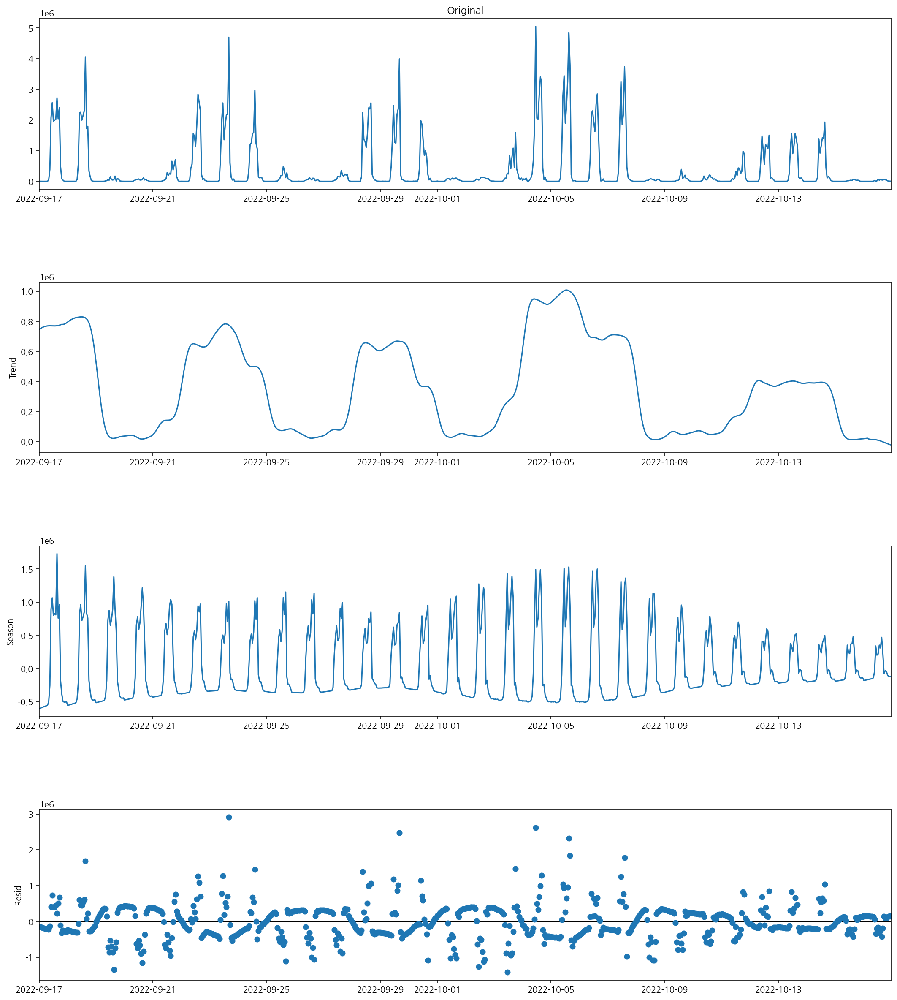

...

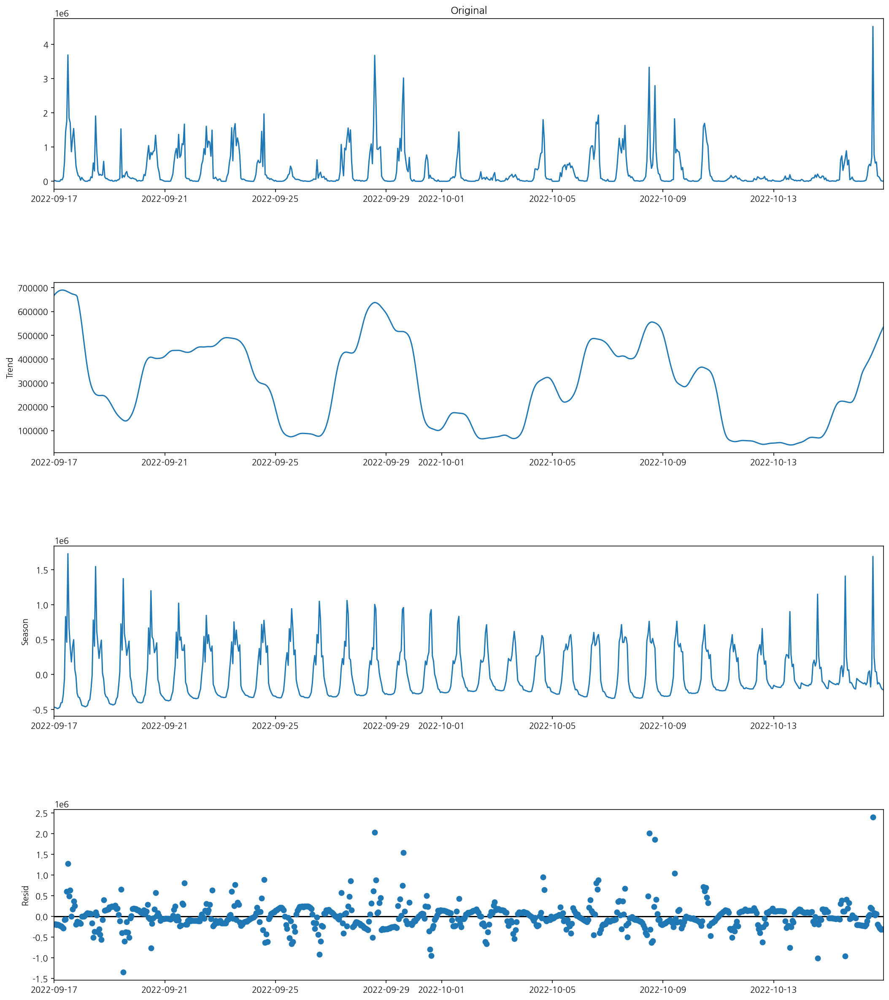

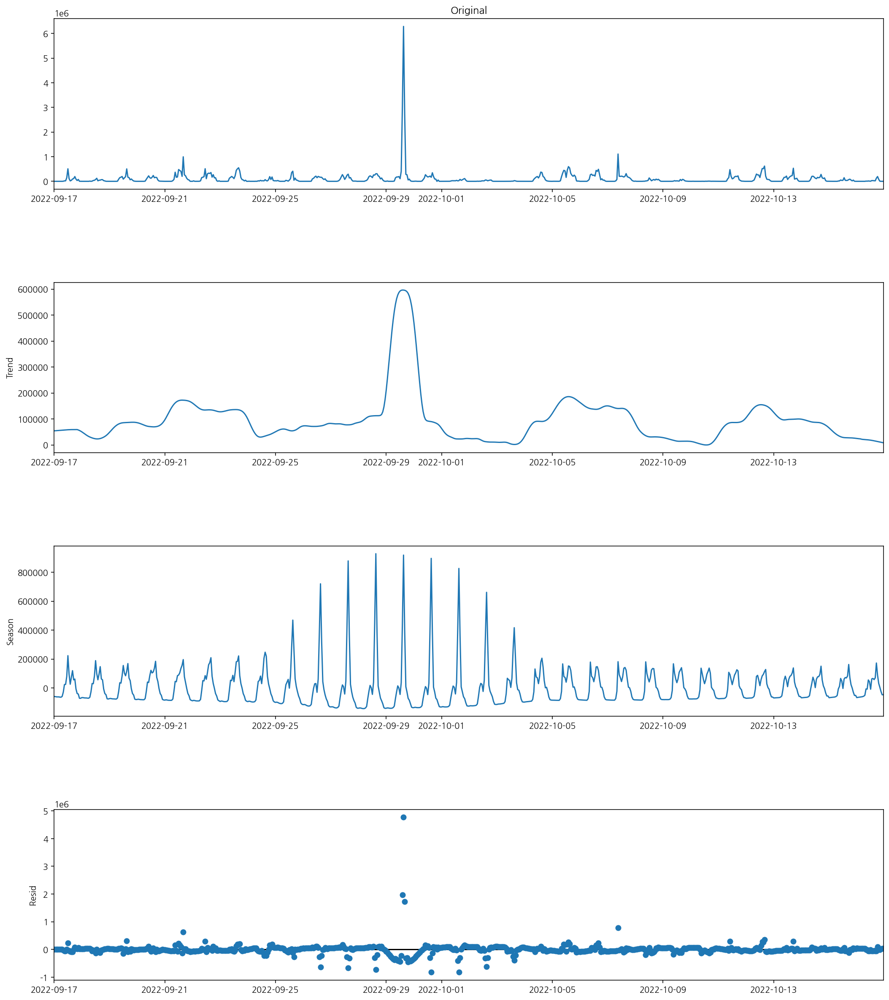

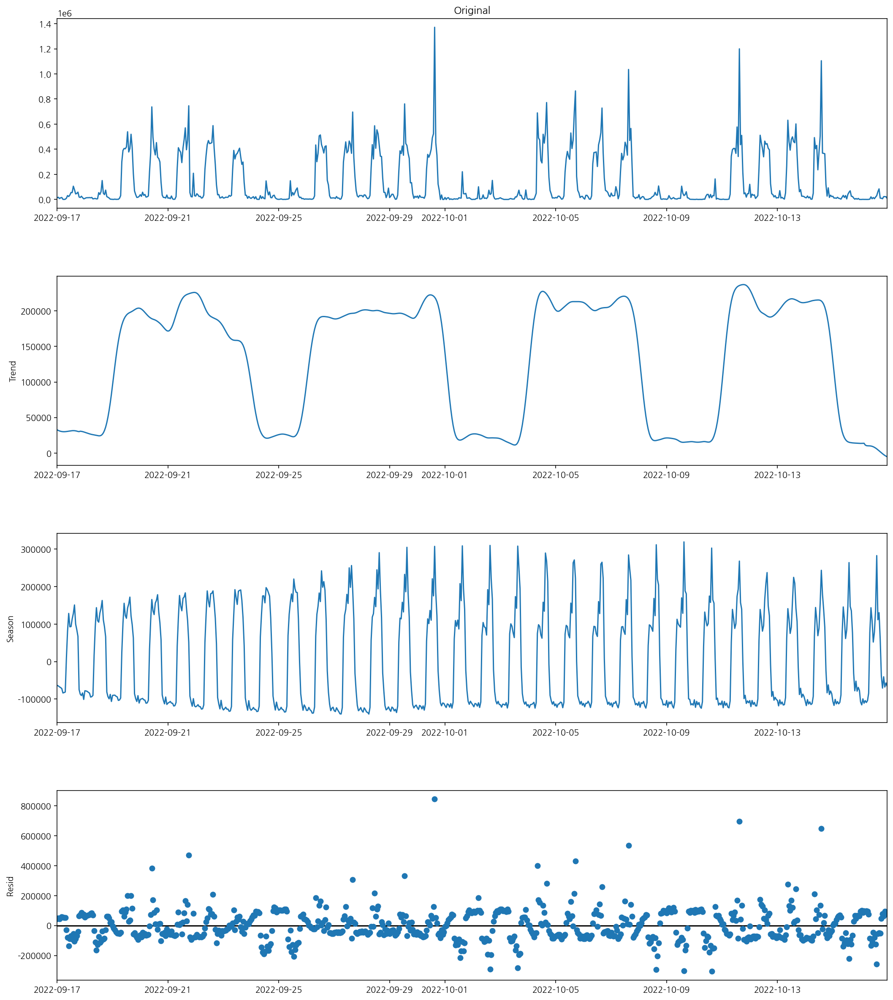

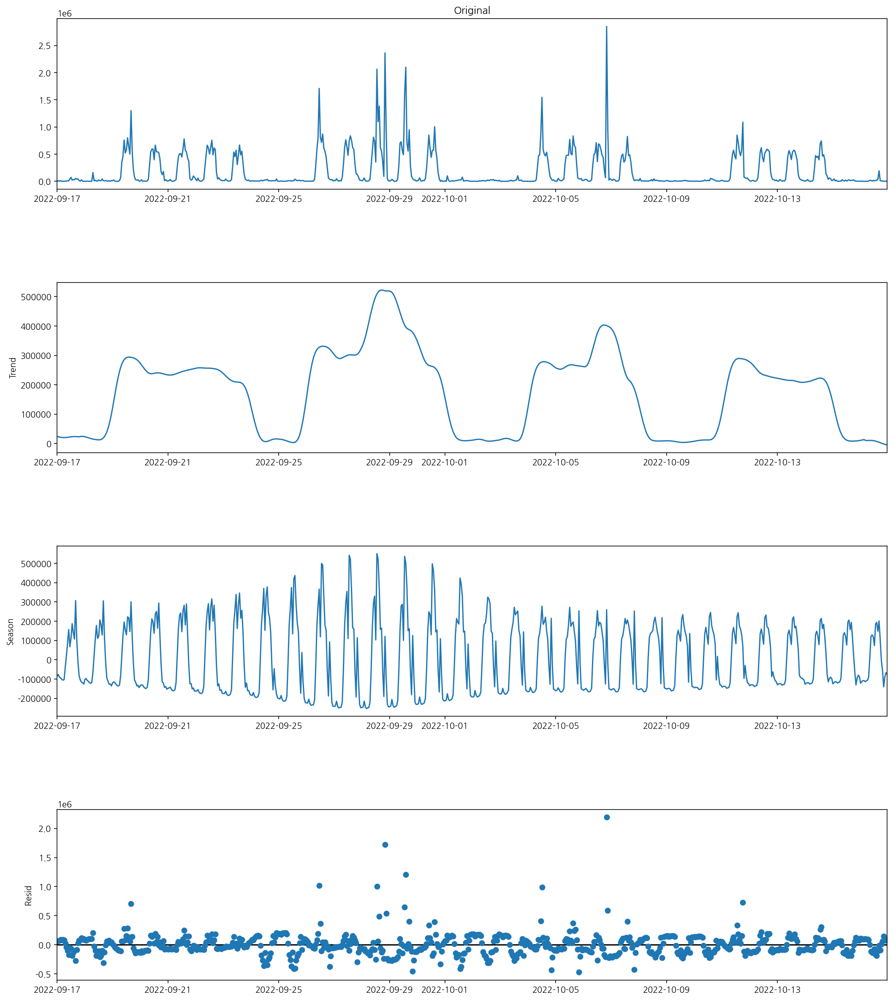

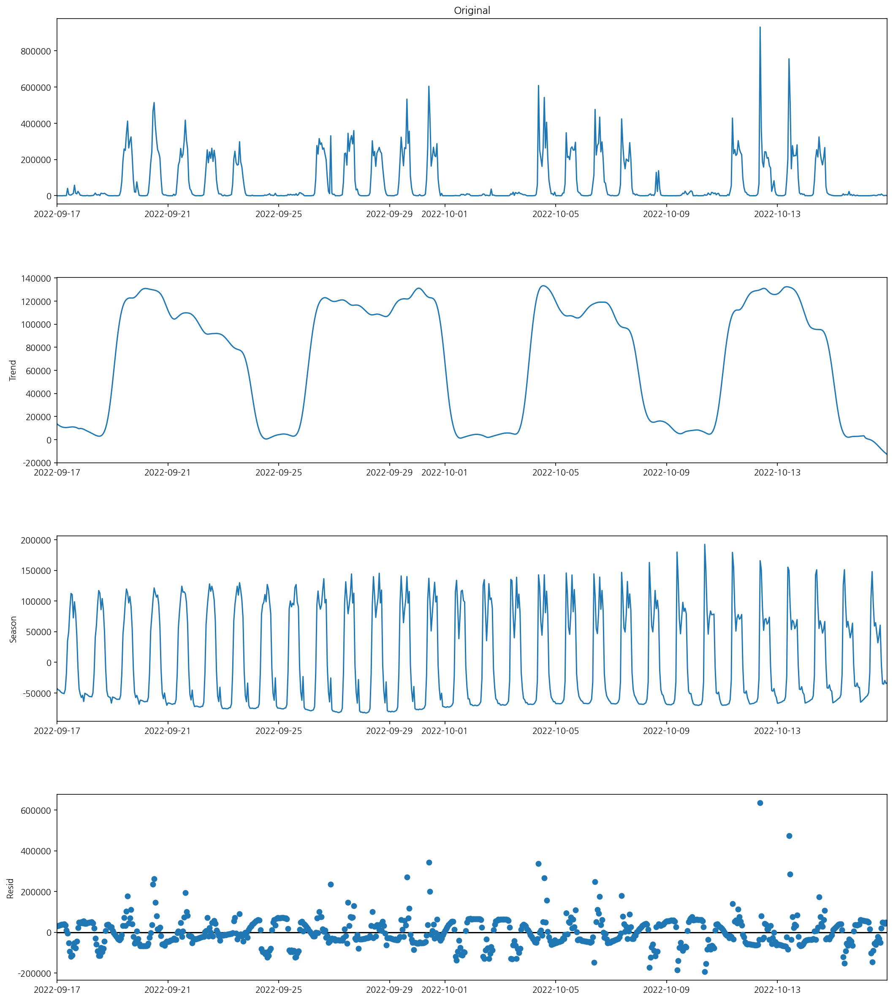

In [ ]:
# http://incredible.ai/time-series/2021/06/01/Time-Series-Decomposition/
# https://github.com/LeeDoYup/RobustSTL
# https://www.statsmodels.org/dev/examples/notebooks/generated/stl_decomposition.html
from statsmodels.tsa.seasonal import STL

for i in range(len(dfs)):
    decomposition = STL(dfs[i]['Original'], seasonal=13) # 시계열 분해, decompostion
    res=decomposition.fit()
    #그래프 그리기.
    fig=res.plot()
    #plt.title()
    fig.set_size_inches(15,18)

    dfs[i]['Trend']=res.trend
    dfs[i]['Seasonal']=res.seasonal
    dfs[i]['Detrend']=(dfs[i]['Original'] - res.trend)


In [ ]:
dfs[19]['Original'].mean()

958563.0972222222

In [ ]:
num = 20 # 확인해보려는 기지국 번호

test_cutoff_date = dfs[num-1].index.max() - timedelta(days=7)

dfs_test = dfs[num-1][kt_shoppingmall_df.index > test_cutoff_date]
dfs_train = dfs[num-1][kt_shoppingmall_df.index <= test_cutoff_date]

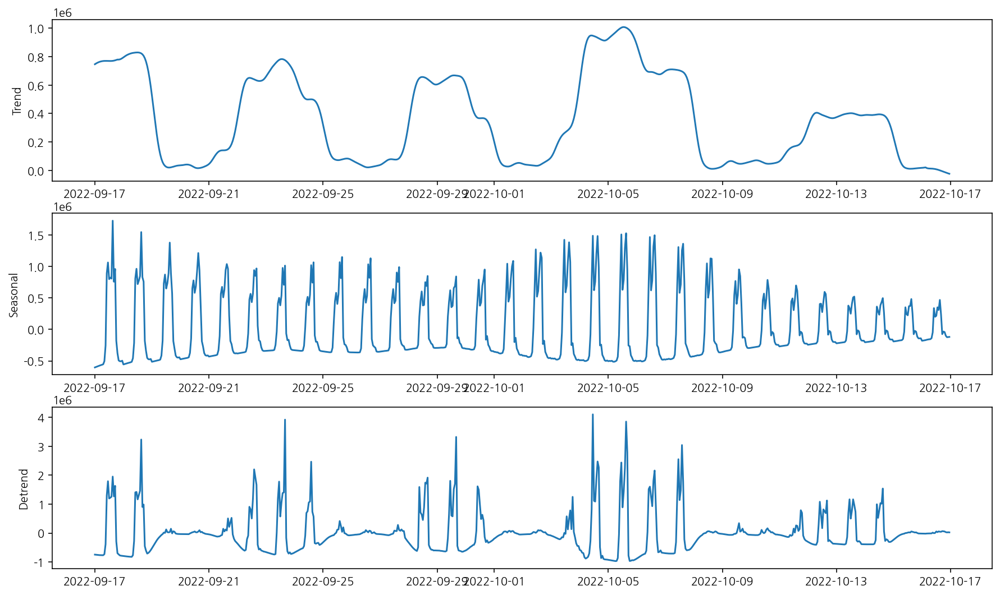

In [ ]:
plt.rcParams['figure.figsize'] = (15, 9)
plt.subplot(3,1,1)
plt.plot(dfs[4]['Trend'])
plt.ylabel("Trend")
plt.subplot(3,1,2)
plt.plot(dfs[4]['Seasonal'])
plt.ylabel("Seasonal")
plt.subplot(3,1,3)
plt.plot(dfs[4]['Detrend'])
plt.ylabel("Detrend")
plt.show()

In [ ]:
#scaler to normalize the dataset
# https://medium.com/analytics-vidhya/time-series-forecasting-predicting-mobile-traffic-with-lstm-649e6ba7ee49 참조.
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range = (0, 1)) #Original 데이터를 위한 scaler
scaler_t = MinMaxScaler(feature_range = (0, 1)) #Trend 데이터를 위한 scaler
scaler_s = MinMaxScaler(feature_range = (0, 1)) #Seasonal 데이터를 위한 scaler
scaler_d = MinMaxScaler(feature_range = (0, 1)) #Detrend 데이터를 위한 scaler

#train 데이터에 맞게 scaler fit
scaler.fit(pd.DataFrame(dfs_train['Original']))
scaler_t.fit(pd.DataFrame(dfs_train['Trend']))
scaler_s.fit_transform(pd.DataFrame(dfs_train['Seasonal']))
scaler_d.fit_transform(pd.DataFrame(dfs_train['Detrend']))

array([[8.59751991e-02],
       [7.63907463e-02],
       [7.46528808e-02],
       [7.28914049e-02],
       [7.18023430e-02],
       [7.06439964e-02],
       [7.05687033e-02],
       [7.54753355e-02],
       [8.85263727e-02],
       [9.91620789e-02],
       [1.73002682e-01],
       [2.61273079e-01],
       [3.70290800e-01],
       [5.34673046e-01],
       [5.73065580e-01],
       [5.67565557e-01],
       [6.59776279e-01],
       [7.13100279e-01],
       [5.20784493e-01],
       [4.51320959e-01],
       [3.19412808e-01],
       [1.72038783e-01],
       [9.54472359e-02],
       [7.44276121e-02],
       [6.74354557e-02],
       [6.93545731e-02],
       [6.56820761e-02],
       [6.54207735e-02],
       [6.48150543e-02],
       [6.47679482e-02],
       [6.61368485e-02],
       [7.25606425e-02],
       [7.66794191e-02],
       [1.16330314e-01],
       [1.40379387e-01],
       [2.22360506e-01],
       [3.57688670e-01],
       [4.70579967e-01],
       [4.99917993e-01],
       [5.78667236e-01],


In [ ]:
#Train 데이터 normalize
dfs_train['Original'] = scaler.transform(pd.DataFrame(dfs_train['Original']))
dfs_train['Trend'] = scaler_t.transform(pd.DataFrame(dfs_train['Trend']))
dfs_train['Seasonal'] = scaler_s.transform(pd.DataFrame(dfs_train['Seasonal']))
dfs_train['Detrend'] = scaler_d.transform(pd.DataFrame(dfs_train['Detrend']))

#Test 데이터 normalize
dfs_test['Original'] = scaler.transform(pd.DataFrame(dfs_test['Original']))
dfs_test['Trend'] = scaler_t.transform(pd.DataFrame(dfs_test['Trend']))
dfs_test['Seasonal'] = scaler_s.transform(pd.DataFrame(dfs_test['Seasonal']))
dfs_test['Detrend'] = scaler_d.transform(pd.DataFrame(dfs_test['Detrend']))

<ipython-input-16-8488037ee1e0>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_train['Original'] = scaler.transform(pd.DataFrame(dfs_train['Original']))
<ipython-input-16-8488037ee1e0>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_train['Trend'] = scaler_t.transform(pd.DataFrame(dfs_train['Trend']))
<ipython-input-16-8488037ee1e0>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveat

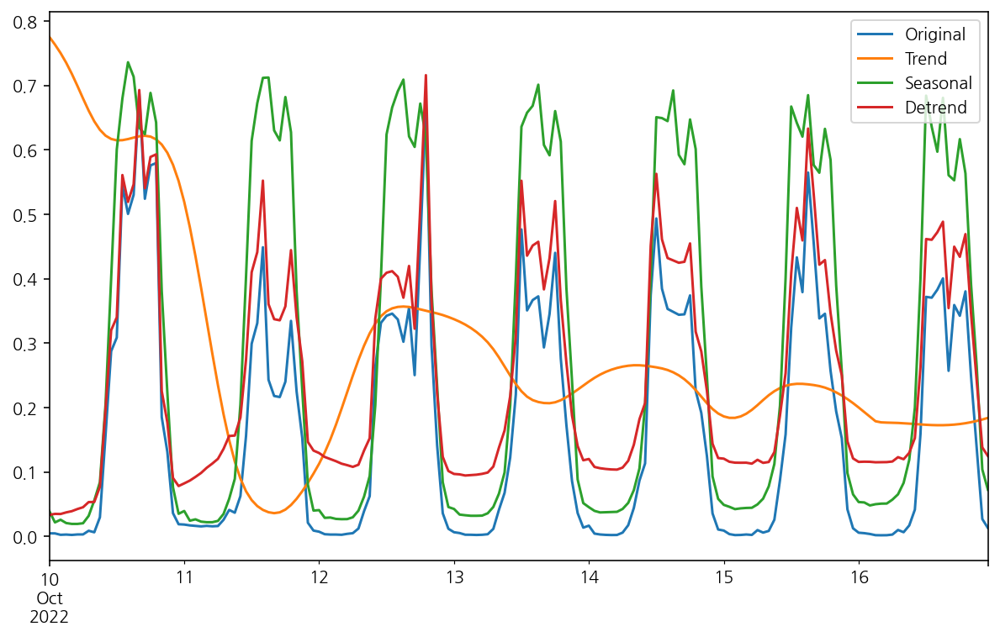

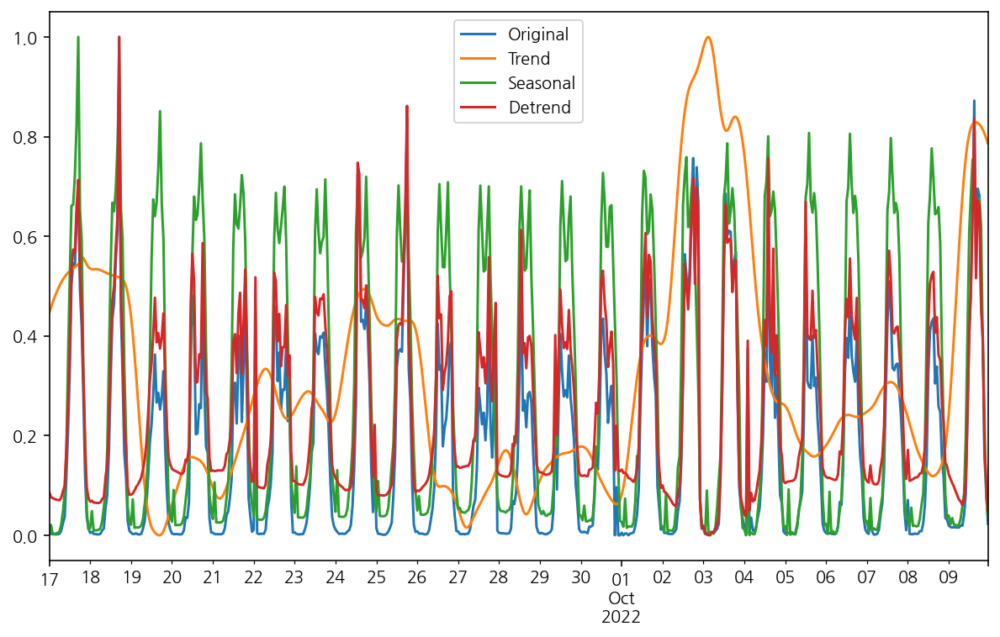

In [ ]:
plt.rcParams['figure.figsize'] = (10, 6)
dfs_test.plot()
dfs_train.plot()

In [ ]:
from numpy import array

#Original 데이터 split
def split_sequence(sequence, n_steps): #sequence 624개
  X, y = list(), list()
  for i in range(len(sequence)):
    end_ix = i + n_steps
    #print(end_ix)
    if end_ix > len(sequence)-1:
      break
    seq_x, seq_y = sequence.iloc[i:end_ix,0], sequence.iloc[end_ix,0] # 0:30데이터, :
    X.append(seq_x)
    y.append(seq_y)
  return array(X), array(y)

#trend 데이터 split
def split_sequence_t(sequence, n_steps): #sequence 624개
  X1, y1 = list(), list()
  for i in range(len(sequence)):
    end_ix = i + n_steps
    #print(end_ix)
    if end_ix > len(sequence)-1:
      break
    seq_x, seq_y = sequence.iloc[i:end_ix,1], sequence.iloc[end_ix,1] # 0:30데이터, :
    X1.append(seq_x)
    y1.append(seq_y)
  return array(X1), array(y1)

#seasonal 데이터 split
def split_sequence_s(sequence, n_steps): #sequence 624개
  X2, y2 = list(), list()
  for i in range(len(sequence)):
    end_ix = i + n_steps
    #print(end_ix)
    if end_ix > len(sequence)-1:
      break
    seq_x, seq_y = sequence.iloc[i:end_ix,2], sequence.iloc[end_ix,2] # 0:30데이터, :
    X2.append(seq_x)
    y2.append(seq_y)
  return array(X2), array(y2)

#detrend 데이터 split
def split_sequence_d(sequence, n_steps): #sequence 624개
  X3, y3 = list(), list()
  for i in range(len(sequence)):
    end_ix = i + n_steps
    #print(end_ix)
    if end_ix > len(sequence)-1:
      break
    seq_x, seq_y = sequence.iloc[i:end_ix,3], sequence.iloc[end_ix,3] # 0:30데이터, :
    X3.append(seq_x)
    y3.append(seq_y)
  return array(X3), array(y3)

raw_seq = dfs_train
n_steps = 24

#Original 데이터
train_X, train_Y = split_sequence(raw_seq, n_steps)
test_X, test_Y =split_sequence(dfs_test, n_steps)

#trend 데이터
train_Xt, train_Yt = split_sequence_t(raw_seq, n_steps)
test_Xt, test_Yt = split_sequence_t(dfs_test, n_steps)

#seasonal 데이터
train_Xs, train_Ys = split_sequence_s(raw_seq, n_steps)
test_Xs, test_Ys = split_sequence_s(dfs_test, n_steps)

#detrend 데이터
train_Xd, train_Yd = split_sequence_d(raw_seq, n_steps)
test_Xd, test_Yd = split_sequence_d(dfs_test, n_steps)

n_features = 1
train_X = train_X.reshape((train_X.shape[0], train_X.shape[1], n_features))
train_Xt = train_Xt.reshape((train_Xt.shape[0], train_Xt.shape[1], n_features))
train_Xs = train_Xs.reshape((train_Xs.shape[0], train_Xs.shape[1], n_features)) 
train_Xd = train_Xd.reshape((train_Xd.shape[0], train_Xd.shape[1], n_features))

test_X= test_X.reshape((test_X.shape[0], test_X.shape[1], n_features))
test_Xt= test_Xt.reshape((test_Xt.shape[0], test_Xt.shape[1], n_features))
test_Xs= test_Xs.reshape((test_Xs.shape[0], test_Xs.shape[1], n_features))
test_Xd = test_Xd.reshape((test_Xd.shape[0], test_Xd.shape[1], n_features))

train_Y = train_Y.reshape((train_Y.shape[0], n_features))
train_Yt = train_Yt.reshape((train_Yt.shape[0], n_features)) 
train_Ys = train_Ys.reshape((train_Ys.shape[0], n_features))
train_Yd = train_Yd.reshape((train_Yd.shape[0], n_features))

test_Y= test_Y.reshape((test_Y.shape[0], n_features))
test_Yt= test_Yt.reshape((test_Yt.shape[0], n_features))
test_Ys= test_Ys.reshape((test_Ys.shape[0], n_features))
test_Yd = test_Yd.reshape((test_Yd.shape[0], n_features))

In [ ]:
#모델 
#data 1 : Original 데이터 분석
#data 2 : Trend 데이터 분석
#data 3 : Seasonal 데이터 분석
#data 4 : Detrend 데이터 분석

#mode 2개: LSTM, CNN

def pred_model(data, mode):
    if data == 1:
        #Original 데이터 모델
        model = keras.Sequential()
        if mode == "LSTM":
                        # 요약된 정보의 차원 갯수, 요약을 할 time window의 크기.              #24, 1
            model.add(layers.LSTM(units = 64, activation = 'relu', return_sequences=True, input_shape=(n_steps, 1))) #, return_sequences=True
            model.add(layers.LSTM(units = 64, activation = 'relu'))
            model.add(layers.Dense(50))
            model.add(layers.Dropout(0.5))
            model.add(layers.Dense(1))
        elif mode == "CNN":
            model.add(layers.Conv1D(
                filters=128, kernel_size=2, activation='relu', input_shape=(n_steps, 1))) # 23 (2개씩 1~30까지 보는데 마지막은 2개가 안되기때문에 총 23개), 64
            model.add(layers.MaxPooling1D(pool_size=2)) # 11,64
            model.add(layers.Conv1D(filters=128,kernel_size=2))
            model.add(layers.MaxPooling1D(pool_size=2)) # 11,64
            model.add(layers.Flatten()) # 512
            model.add(layers.Dense(50)) # 뉴럴 네트워크
            model.add(layers.Dropout(0.5))
            model.add(layers.Dense(1))
        # 그라이언트를 계산
        model.compile(optimizer= 'adam', loss='mse', metrics=['mae'])
        model.summary()

    elif data == 2:
        #Trend 데이터 모델
        model = keras.Sequential()
        if mode == "LSTM":
                        # 요약된 정보의 차원 갯수, 요약을 할 time window의 크기.              #24, 1
            # model.add(layers.LSTM(units = 128, activation = 'relu', input_shape=(n_steps, 1))) #, return_sequences=True
            model.add(layers.LSTM(units = 64, activation = 'relu', input_shape=(n_steps, 1)))
            model.add(layers.Dense(50))
            model.add(layers.Dropout(0.5))
            model.add(layers.Dense(1))
        elif mode == "CNN":
            model.add(layers.Conv1D(filters=256, kernel_size=2, activation='relu', input_shape=(n_steps, 1))) # 23 (2개씩 1~30까지 보는데 마지막은 2개가 안되기때문에 총 23개), 64
            model.add(layers.MaxPooling1D(pool_size=2)) # 11,64
            model.add(layers.Conv1D(filters=512,kernel_size=2))
            model.add(layers.MaxPooling1D(pool_size=2)) # 11,64
            # model.add(layers.Conv1D(filters=256,kernel_size=2))
            # model.add(layers.MaxPooling1D(pool_size=2)) # 11,64
            model.add(layers.Flatten()) # 512
            model.add(layers.Dense(50)) # 뉴럴 네트워크
            model.add(layers.Dropout(0.5))
            model.add(layers.Dense(1))
        # 그라이언트를 계산
        model.compile(optimizer= 'adam', loss='mse', metrics=['mae'])
        model.summary()

    elif data == 3:
        #Seasonal 데이터 모델
        model = keras.Sequential()
        if mode == "LSTM":
                        # 요약된 정보의 차원 갯수, 요약을 할 time window의 크기.              #24, 1
            model.add(layers.LSTM(units = 64, activation = 'relu', return_sequences=True, input_shape=(n_steps, 1))) #, return_sequences=True
            model.add(layers.LSTM(units = 64, activation = 'relu', input_shape=(n_steps, 1)))
            model.add(layers.Dense(50))
            model.add(layers.Dropout(0.5))
            model.add(layers.Dense(1))
        elif mode == "CNN":
            model.add(layers.Conv1D(
                filters=64, kernel_size=2, activation='relu', input_shape=(n_steps, 1))) # 23 (2개씩 1~30까지 보는데 마지막은 2개가 안되기때문에 총 23개), 64
            model.add(layers.MaxPooling1D(pool_size=2)) # 11,64
            model.add(layers.Flatten()) # 512
            model.add(layers.Dense(50)) # 뉴럴 네트워크
            model.add(layers.Dropout(0.5))
            model.add(layers.Dense(1))
        # 그라이언트를 계산
        model.compile(optimizer= 'adam', loss='mse', metrics=['mae'])
        model.summary()

    elif data == 4:
        #Detrend 데이터 모델
        if mode == "LSTM":
            model = keras.Sequential()
            #                # 요약된 정보의 차원 갯수, 요약을 할 time window의 크기.              #24, 1
            model.add(layers.LSTM(units = 64, activation = 'relu', input_shape=(n_steps, 1))) #, return_sequences=True
            # model.add(layers.LSTM(units = 128, activation = 'relu'))
            model.add(layers.Dense(50))
            model.add(layers.Dropout(0.5))
            model.add(layers.Dense(1))
        elif mode == "CNN":
            model.add(layers.Conv1D(
                filters=128, kernel_size=2, activation='relu', input_shape=(n_steps, 1))) # 23 (2개씩 1~30까지 보는데 마지막은 2개가 안되기때문에 총 23개), 64
            model.add(layers.MaxPooling1D(pool_size=2)) # 11,64
            model.add(layers.Conv1D(filters=128,kernel_size=2))
            model.add(layers.MaxPooling1D(pool_size=2)) # 11,64
            model.add(layers.Flatten()) # 512
            model.add(layers.Dense(50)) # 뉴럴 네트워크
            model.add(layers.Dropout(0.5))
            model.add(layers.Dense(1))
        # 그라이언트를 계산
        model.compile(optimizer= 'adam', loss='mse', metrics=['mae'])
        model.summary()
    return model

In [ ]:
for k in range(30):
    print("-"*6, k,"번째","-"*6)
    raw_seq = dfs_train
    n_steps = 24

    #Original 데이터
    train_X, train_Y = split_sequence(raw_seq, n_steps)
    test_X, test_Y =split_sequence(dfs_test, n_steps)

    #trend 데이터
    train_Xt, train_Yt = split_sequence_t(raw_seq, n_steps)
    test_Xt, test_Yt = split_sequence_t(dfs_test, n_steps)

    #seasonal 데이터
    train_Xs, train_Ys = split_sequence_s(raw_seq, n_steps)
    test_Xs, test_Ys = split_sequence_s(dfs_test, n_steps)

    #detrend 데이터
    train_Xd, train_Yd = split_sequence_d(raw_seq, n_steps)
    test_Xd, test_Yd = split_sequence_d(dfs_test, n_steps)

    n_features = 1
    train_X = train_X.reshape((train_X.shape[0], train_X.shape[1], n_features))
    train_Xt = train_Xt.reshape((train_Xt.shape[0], train_Xt.shape[1], n_features))
    train_Xs = train_Xs.reshape((train_Xs.shape[0], train_Xs.shape[1], n_features)) 
    train_Xd = train_Xd.reshape((train_Xd.shape[0], train_Xd.shape[1], n_features)) 

    test_X= test_X.reshape((test_X.shape[0], test_X.shape[1], n_features))
    test_Xt= test_Xt.reshape((test_Xt.shape[0], test_Xt.shape[1], n_features))
    test_Xs= test_Xs.reshape((test_Xs.shape[0], test_Xs.shape[1], n_features))
    test_Xd = test_Xd.reshape((test_Xd.shape[0], test_Xd.shape[1], n_features))

    train_Y = train_Y.reshape((train_Y.shape[0], n_features))
    train_Yt = train_Yt.reshape((train_Yt.shape[0], n_features)) 
    train_Ys = train_Ys.reshape((train_Ys.shape[0], n_features))
    train_Yd = train_Yd.reshape((train_Yd.shape[0], n_features)) 

    test_Y= test_Y.reshape((test_Y.shape[0], n_features))
    test_Yt= test_Yt.reshape((test_Yt.shape[0], n_features))
    test_Ys= test_Ys.reshape((test_Ys.shape[0], n_features))
    test_Yd = test_Yd.reshape((test_Yd.shape[0], n_features))

    #모델 지정
    #mode 1 : Original 데이터 분석
    #mode 2 : Trend 데이터 분석
    #mode 3 : Seasonal 데이터 분석
    #mode 4 : Detrend 데이터 분석

    model = pred_model(1, "LSTM")
    model_t = pred_model(2, "LSTM")
    model_s = pred_model(3, "CNN")
    model_d = pred_model(4, "LSTM")

    #모델 학습
    time1 = datetime.datetime.now()
    hist=model.fit(train_X, train_Y, batch_size=32, epochs = 50, validation_data = (test_X, test_Y), verbose = 0) #아마 데이터가 546개이니 iteration = 18이 되려나?
    time2 = datetime.datetime.now()
    hist_t=model_t.fit(train_Xt, train_Yt, batch_size=32, epochs = 50, validation_data = (test_Xt, test_Yt), verbose = 0)
    time3 = datetime.datetime.now()
    hist_s=model_s.fit(train_Xs, train_Ys, batch_size=32, epochs = 50, validation_data = (test_Xs, test_Ys), verbose = 0)
    time4 = datetime.datetime.now()
    hist_d=model_d.fit(train_Xd, train_Yd, batch_size=32, epochs = 50, validation_data = (test_Xd, test_Yd), verbose = 0)
    time5 = datetime.datetime.now()

    #예측에 걸린 시간 계산
    Original_t = time2 - time1
    Trend_t = time3-time2
    Seasonal_t = time4 - time3
    Detrend_t = time5 - time4

    Original_time.append(Original_t)
    Seasonal_time.append(Trend_t + Seasonal_t)
    Detrend_time.append(Trend_t + Detrend_t)

    #학습한 모델을 통해 얼마나 예측을 잘 할 수 있는지 확인하는 과정
    pred = model.predict(test_X)
    pred_t = model_t.predict(test_Xt)
    pred_s = model_s.predict(test_Xs)
    pred_d = model_d.predict(test_Xd)

    #invert predictions
    pred = scaler.inverse_transform(pred)
    test_Y = scaler.inverse_transform(test_Y)

    pred_t = scaler_t.inverse_transform(pred_t)
    test_Yt = scaler_t.inverse_transform(test_Yt)

    pred_s = scaler_s.inverse_transform(pred_s)
    test_Ys = scaler_s.inverse_transform(test_Ys)

    pred_d = scaler_d.inverse_transform(pred_d)
    test_Yd = scaler_d.inverse_transform(test_Yd)

    #calcultae MAE
    Score = mean_absolute_error(test_Y[:,0], pred[:,0])
    Score_t = mean_absolute_error(test_Yt[:,0], pred_t[:,0])
    Score_s = mean_absolute_error(test_Ys[:,0], pred_s[:,0])
    Score_d = mean_absolute_error(test_Yd[:,0], pred_d[:,0])

    #알고리즘 별 MAE 계산
    Seasonal_mae = np.mean(np.abs(pred_t+pred_s - test_Y))
    Detrend_mae = np.mean(np.abs(pred_t+pred_d - test_Y))

    #결과 저장용 list에 저장.
    Original_result.append(Score)
    Seasonal_result.append(Seasonal_mae)
    Detrend_result.append(Detrend_mae)

------ 0 번째 ------
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 24, 64)            16896     
                                                                 
 lstm_1 (LSTM)               (None, 64)                33024     
                                                                 
 dense (Dense)               (None, 50)                3250      
                                                                 
 dropout (Dropout)           (None, 50)                0         
                                                                 
 dense_1 (Dense)             (None, 1)                 51        
                                                                 
Total params: 53,221
Trainable params: 53,221
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_1"
___________

In [ ]:
for i in range(len(Original_time)):
    print(Original_time[i])
print('\n')
Original_mean = 0
for i in range(len(Original_result)):
    Original_mean = Original_mean + Original_result[i]
    print(Original_result[i])
print("\n", Original_mean / 30)

0:00:27.946651
0:00:18.047839
0:00:18.765764
0:00:18.103103
0:00:18.428279
0:00:19.572846
0:00:19.207547
0:00:20.127417
0:00:18.283835
0:00:18.040874
0:00:18.695257
0:00:18.775217
0:00:18.168785
0:00:20.839362
0:00:18.067069
0:00:18.725162
0:00:19.066288
0:00:18.700826
0:00:18.191619
0:00:20.627431
0:00:18.387836
0:00:18.560740
0:00:18.644788
0:00:17.953782
0:00:18.055863
0:00:20.193554
0:00:20.108855
0:00:18.834638
0:00:17.823354
0:00:18.711294


282909.2207573785
219854.81410980225
222798.1175181071
244447.14187282987
250234.5498063829
219623.74297417534
264733.33544921875
346695.2478298611
266920.2946777344
239961.34334309897
275981.1024712457
265804.2683105469
337952.15245225694
220931.35668945312
293687.9992404514
266185.7848307292
241108.94851345487
275101.1529947917
247480.56724378798
301882.2593858507
284671.3342759874
246621.81643337675
306206.8759765625
279166.27886284725
225041.4800482856
245045.3455403646
209365.27892896865
226231.2651723226
225660.43719821505
219643.279726

In [ ]:
for i in range(len(Seasonal_time)):
    print(Seasonal_time[i])
print('\n')
Seasonal_mean = 0
for i in range(len(Seasonal_result)):
    Seasonal_mean = Seasonal_mean + Seasonal_result[i]
    print(Seasonal_result[i])
print("\n", Seasonal_mean / 30)

0:00:14.419979
0:00:14.833605
0:00:12.440894
0:00:14.994250
0:00:15.385989
0:00:15.331585
0:00:16.670776
0:00:13.411597
0:00:15.103328
0:00:14.418848
0:00:16.722785
0:00:14.353880
0:00:17.248670
0:00:16.192417
0:00:14.329675
0:00:13.129957
0:00:15.313918
0:00:16.696760
0:00:17.166198
0:00:16.639721
0:00:12.697625
0:00:12.868240
0:00:12.717805
0:00:17.225711
0:00:15.239040
0:00:13.332830
0:00:17.816817
0:00:12.757655
0:00:15.710203
0:00:12.456125


194182.35373263888
205996.01215277778
194346.19574652778
202508.79210069444
190994.42447916666
198391.041015625
195760.49652777778
189576.75846354166
189798.98546006944
205467.49522569444
199387.53515625
185465.19357638888
192653.84157986112
194353.93793402778
203772.76128472222
211628.95638020834
193247.55490451388
191754.72526041666
197462.56510416666
195779.45290798612
187175.39800347222
190620.19487847222
200734.57942708334
200275.63802083334
196951.69487847222
191635.42621527778
201424.0546875
190894.27170138888
194213.78038194444
212546

In [ ]:
for i in range(len(Detrend_time)):
    print(Detrend_time[i])
print('\n')
Detrend_mean = 0
for i in range(len(Detrend_result)):
    Detrend_mean = Detrend_mean + Detrend_result[i]
    print(Detrend_result[i])
print("\n", Detrend_mean / 30)

0:00:22.379856
0:00:20.915754
0:00:20.954997
0:00:19.106901
0:00:20.066953
0:00:21.039989
0:00:20.677254
0:00:19.528818
0:00:19.093141
0:00:20.788208
0:00:20.962720
0:00:20.638265
0:00:21.386049
0:00:20.903797
0:00:20.918802
0:00:19.723948
0:00:20.983451
0:00:22.426697
0:00:20.791895
0:00:22.323646
0:00:20.772573
0:00:20.981472
0:00:19.582526
0:00:20.696208
0:00:20.914454
0:00:19.641127
0:00:21.771699
0:00:19.608204
0:00:21.399936
0:00:21.134005


239329.18381076388
238864.36480034722
261499.07291666666
218114.59982638888
255807.845703125
264444.4368489583
228401.25846354166
219153.09939236112
233075.10460069444
248829.82356770834
272851.49522569444
235940.27365451388
215681.88042534722
217878.46462673612
234612.77994791666
240436.59440104166
225248.89149305556
262640.7697482639
222121.81467013888
235061.64930555556
227551.67296006944
239254.29014756944
225987.41710069444
203498.40603298612
230807.12999131944
221407.99392361112
312288.08984375
231115.02842881944
231485.703125
213275.41

In [ ]:
import sklearn
import statsmodels
import tensorflow
import matplotlib
print(sklearn.__version__)
print(statsmodels.__version__)
print(tensorflow.__version__)
print(matplotlib.__version__)

1.0.2
0.13.5
2.9.2
3.2.2
